# Week 7 Assignment: "Clean" Notebook

This notebook presents (or attempts to present) data I will use on my project without errors. I also aim to be more intentional, asking why the outputs I produce matter or not, and what they are telling me. 

## Working Research Question: Gentrification and Tourism

I am exploring the interactions between the processes of gentrification and tourism in San Juan, Puerto Rico, with an emphasis on Santurce. This question has two elements: gentrification and tourism. I will try to cover both on this notebook.

In [1]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt


/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


### Gentrification

There are various indicators for gentrification including racial composition, changes in rental market, household income, and education. For the midterm, I mapped racial composition, using Latinx and Non-Latinx, aiming to see US American clusters vs. Puerto Ricans (natives). As Ryan pointed out, this is problematic because it might be including other types of migratory populations; therefore, I need to address that here. I also worked with household income and previously with rent. I am including "what works" and what contributes to my research inquiry here. 

#### Household Income

The next presented outputs use the ACS 2019 Community Survey for San Juan, Puerto Rico. They explore household income. 

In [2]:
df= gpd.read_file('acs2019_san juan_household_income.geojson')

In [4]:
#I am going to conduct some basic data exploration and cleaning. 

In [3]:
#data types
df.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             365 non-null    object  
 1   name              365 non-null    object  
 2   B19001001         365 non-null    float64 
 3   B19001001, Error  365 non-null    float64 
 4   B19001002         365 non-null    float64 
 5   B19001002, Error  365 non-null    float64 
 6   B19001003         365 non-null    float64 
 7   B19001003, Error  365 non-null    float64 
 8   B19001004         365 non-null    float64 
 9   B19001004, Error  365 non-null    float64 
 10  B19001005         365 non-null    float64 
 11  B19001005, Error  365 non-null    float64 
 12  B19001006         365 non-null    float64 
 13  B19001006, Error  365 non-null    float64 
 14  B19001007         365 non-null    float64 
 15  B19001007, Error  365 non-null    float64 
 16  B19001008         

/tmp/ipykernel_57/4079988822.py:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  df.info(verbose=True, null_counts=True)


In [4]:
df = df.drop([0])

In [5]:
df.head()

,geoid,name,B19001001,"B19001001, Error",B19001002,"B19001002, Error",B19001003,"B19001003, Error",B19001004,"B19001004, Error",...,"B19001013, Error",B19001014,"B19001014, Error",B19001015,"B19001015, Error",B19001016,"B19001016, Error",B19001017,"B19001017, Error",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,71.0,69.0,32.0,44.0,36.0,14.0,15.0,...,11.0,7.0,11.0,26.0,30.0,18.0,22.0,14.0,22.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,86.0,66.0,38.0,11.0,15.0,54.0,36.0,...,18.0,0.0,14.0,0.0,14.0,10.0,15.0,21.0,23.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,104.0,45.0,40.0,69.0,55.0,31.0,35.0,...,31.0,55.0,42.0,0.0,14.0,13.0,14.0,39.0,28.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,64.0,152.0,61.0,44.0,36.0,10.0,17.0,...,14.0,0.0,14.0,0.0,14.0,0.0,14.0,0.0,14.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,59.0,37.0,31.0,6.0,9.0,17.0,21.0,...,25.0,35.0,22.0,18.0,22.0,35.0,28.0,28.0,19.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [6]:
list(df)

['geoid',
 'name',
 'B19001001',
 'B19001001, Error',
 'B19001002',
 'B19001002, Error',
 'B19001003',
 'B19001003, Error',
 'B19001004',
 'B19001004, Error',
 'B19001005',
 'B19001005, Error',
 'B19001006',
 'B19001006, Error',
 'B19001007',
 'B19001007, Error',
 'B19001008',
 'B19001008, Error',
 'B19001009',
 'B19001009, Error',
 'B19001010',
 'B19001010, Error',
 'B19001011',
 'B19001011, Error',
 'B19001012',
 'B19001012, Error',
 'B19001013',
 'B19001013, Error',
 'B19001014',
 'B19001014, Error',
 'B19001015',
 'B19001015, Error',
 'B19001016',
 'B19001016, Error',
 'B19001017',
 'B19001017, Error',
 'geometry']

In [7]:
# columns to keep
columns_to_keep = ['geoid',
 'name',
 'B19001001',
 'B19001002',
 'B19001003',
 'B19001004',
 'B19001005',
 'B19001006',
 'B19001007',
 'B19001008',
 'B19001009',
 'B19001010',
 'B19001011',
 'B19001012',
 'B19001013',
 'B19001014',
 'B19001015',
 'B19001016',
 'B19001017',
 'geometry']

In [8]:
# redefine df with only columns to keep
df = df[columns_to_keep]

In [9]:
df.head()

,geoid,name,B19001001,B19001002,B19001003,B19001004,B19001005,B19001006,B19001007,B19001008,B19001009,B19001010,B19001011,B19001012,B19001013,B19001014,B19001015,B19001016,B19001017,geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,44.0,8.0,21.0,0.0,7.0,7.0,26.0,18.0,14.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,50.0,22.0,38.0,0.0,16.0,0.0,0.0,10.0,21.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,33.0,22.0,31.0,24.0,31.0,55.0,0.0,13.0,39.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,15.0,6.0,12.0,24.0,23.0,35.0,18.0,35.0,28.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [10]:
list(df)

['geoid',
 'name',
 'B19001001',
 'B19001002',
 'B19001003',
 'B19001004',
 'B19001005',
 'B19001006',
 'B19001007',
 'B19001008',
 'B19001009',
 'B19001010',
 'B19001011',
 'B19001012',
 'B19001013',
 'B19001014',
 'B19001015',
 'B19001016',
 'B19001017',
 'geometry']

In [11]:
df.columns = ['geoid',
 'name',
'Total',
'Less than $10,000',
'$10,000 to $14,999',
'$15,000 to $19,999',
'$20,000 to $24,999',
'$25,000 to $29,999',
'$30,000 to $34,999',
'$35,000 to $39,999',
'$40,000 to $44,999',
'$45,000 to $49,999',
'$50,000 to $59,999',
'$60,000 to $74,999',
'$75,000 to $99,999',
'$100,000 to $124,999',
'$125,000 to $149,999',
'$150,000 to $199,999',
'$200,000 or more',
 'geometry']

In [12]:
df.head()

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999","$40,000 to $44,999","$45,000 to $49,999","$50,000 to $59,999","$60,000 to $74,999","$75,000 to $99,999","$100,000 to $124,999","$125,000 to $149,999","$150,000 to $199,999","$200,000 or more",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,44.0,8.0,21.0,0.0,7.0,7.0,26.0,18.0,14.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,50.0,22.0,38.0,0.0,16.0,0.0,0.0,10.0,21.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,33.0,22.0,31.0,24.0,31.0,55.0,0.0,13.0,39.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,15.0,6.0,12.0,24.0,23.0,35.0,18.0,35.0,28.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


<AxesSubplot:>

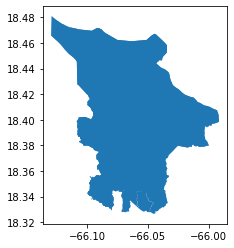

In [13]:
#plotting it 
df.plot()

In [16]:
#That is San Juan. I will use this simple plot to show the form of the city for people that don't know it. 

In [14]:
df_sorted = df.sort_values(by='Total',ascending = False)

In [15]:
df_sorted[['geoid','Total']].head(10)

,geoid,Total
364,16000US7276770,138385.0
199,15000US721270068001,2334.0
345,15000US721270100421,1100.0
316,15000US721270098005,1062.0
340,15000US721270100222,1023.0
334,15000US721270100022,1001.0
331,15000US721270100013,998.0
281,15000US721270091112,930.0
234,15000US721270080011,925.0
239,15000US721270080023,909.0


In [19]:
#As Ryan pointed out, I have a row that shows all of San Juan, so I need to drop that.

In [16]:
df_sorted[['geoid','Total']].head(10)

,geoid,Total
364,16000US7276770,138385.0
199,15000US721270068001,2334.0
345,15000US721270100421,1100.0
316,15000US721270098005,1062.0
340,15000US721270100222,1023.0
334,15000US721270100022,1001.0
331,15000US721270100013,998.0
281,15000US721270091112,930.0
234,15000US721270080011,925.0
239,15000US721270080023,909.0


In [17]:
df = df.drop([364])

<AxesSubplot:>

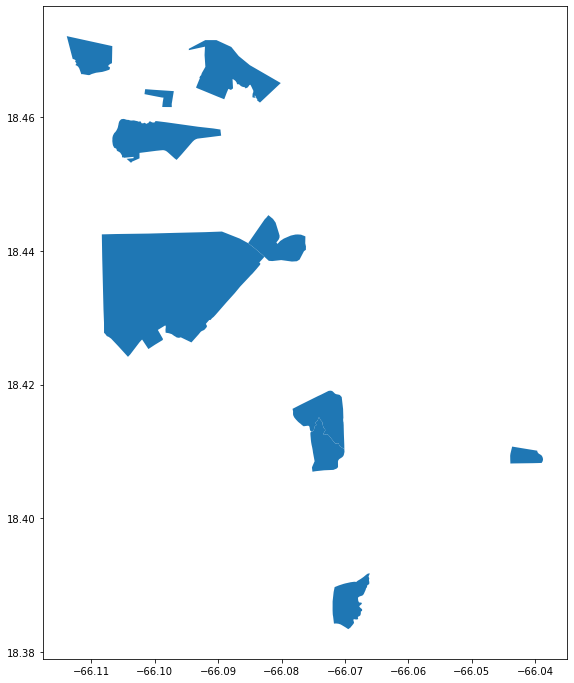

In [18]:
# plotting the highest 
df_sorted.tail(10).plot(figsize=(12,12))

<AxesSubplot:>

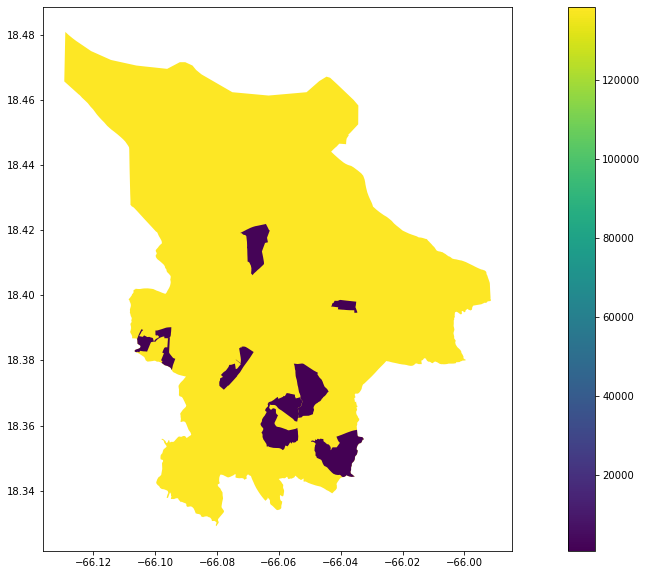

In [19]:
#here it has a base map and it's showing me the places with the highest population
df_sorted.head(10).plot(figsize=(20,10),
                          column='Total',
                          legend=True)

In [20]:
# look at the data types
df.info(verbose=True, null_counts=True

SyntaxError: unexpected EOF while parsing (3926854689.py, line 2)

In [21]:
#From here, I know I troped the one that I needed to drop (from 364 entries, now I have 363).

In [22]:
#mean
df['Total'].mean()

383.12396694214874

In [23]:
# get some stats
df['Total'].describe()

count     363.000000
mean      383.123967
std       226.645313
min         0.000000
25%       244.500000
50%       339.000000
75%       486.000000
max      2334.000000
Name: Total, dtype: float64

In [24]:
#i am going to normalize the data now
list(df)

['geoid',
 'name',
 'Total',
 'Less than $10,000',
 '$10,000 to $14,999',
 '$15,000 to $19,999',
 '$20,000 to $24,999',
 '$25,000 to $29,999',
 '$30,000 to $34,999',
 '$35,000 to $39,999',
 '$40,000 to $44,999',
 '$45,000 to $49,999',
 '$50,000 to $59,999',
 '$60,000 to $74,999',
 '$75,000 to $99,999',
 '$100,000 to $124,999',
 '$125,000 to $149,999',
 '$150,000 to $199,999',
 '$200,000 or more',
 'geometry']

In [25]:
#creating columns with normalized data
df['Percent Households with Less than $10,000']=df['Less than $10,000']/df['Total']*100
df['Percent Households with Less than $10,000']=df['Less than $10,000']/df['Total']*100
df['Percent Households with $15,000 to $19,999']=df['$15,000 to $19,999']/df['Total']*100
df['Percent Households with $20,000 to $24,999']=df['$20,000 to $24,999']/df['Total']*100
df['Percent Households with $25,000 to $29,999']=df['$25,000 to $29,999']/df['Total']*100
df['Percent Households with $30,000 to $34,999']=df['$30,000 to $34,999']/df['Total']*100
df['Percent Households with $35,000 to $39,999']=df['$35,000 to $39,999']/df['Total']*100
df['Percent Households with $40,000 to $44,999']=df['$40,000 to $44,999']/df['Total']*100
df['Percent Households with $45,000 to $49,999']=df['$45,000 to $49,999']/df['Total']*100
df['Percent Households with $50,000 to $59,999']=df['$50,000 to $59,999']/df['Total']*100
df['Percent Households with $60,000 to $74,999']=df['$60,000 to $74,999']/df['Total']*100
df['Percent Households with $75,000 to $99,999']=df['$75,000 to $99,999']/df['Total']*100
df['Percent Households with $100,000 to $124,999']=df['$100,000 to $124,999']/df['Total']*100
df['Percent Houselholds with $125,000 to $149,999']=df['$125,000 to $149,999']/df['Total']*100
df['Percent Households with $150,000 to $199,999']=df['$150,000 to $199,999']/df['Total']*100
df['Percent Households with $200,000 or more']=df['$200,000 or more']/df['Total']*100

In [26]:
#these are the columns I had last time. I am going to create some new columns that go with guidelines for poverty.
df['Percent Households with Less than $19,000']=df['Less than $10,000']+ df['$15,000 to $19,999']/df['Total']*100
df['Percent Households with $20,000 to $49,999']=df['$20,000 to $24,999']+ df['$25,000 to $29,999']+ df['$30,000 to $34,999']+ df['$35,000 to $39,999']+ df['$40,000 to $44,999']+ df['$45,000 to $49,999']/df['Total']*100

In [27]:
df['Percent Households with $50,000 to $149,999']=df['$50,000 to $59,999']+df['$60,000 to $74,999']+df['$75,000 to $99,999']+df['$100,000 to $124,999']+ df['$125,000 to $149,999']/df['Total']*100


In [28]:
df['Percent Households with More than $125,000']= df['$125,000 to $149,999']+df['$150,000 to $199,999']+df['$200,000 or more']/df['Total']*100

In [29]:
df.head()

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999",...,"Percent Households with $60,000 to $74,999","Percent Households with $75,000 to $99,999","Percent Households with $100,000 to $124,999","Percent Houselholds with $125,000 to $149,999","Percent Households with $150,000 to $199,999","Percent Households with $200,000 or more","Percent Households with Less than $19,000","Percent Households with $20,000 to $49,999","Percent Households with $50,000 to $149,999","Percent Households with More than $125,000"
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,...,0.000000,2.250804,2.250804,8.360129,5.787781,4.501608,73.501608,85.572347,43.360129,48.501608
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,...,0.000000,4.419890,0.000000,0.000000,2.762431,5.801105,80.917127,130.077348,54.000000,15.801105
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,...,4.989605,6.444906,11.434511,0.000000,2.702703,8.108108,51.444906,125.573805,141.000000,21.108108
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,155.773585,30.000000,29.000000,0.000000
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,...,9.160305,8.778626,13.358779,6.870229,13.358779,10.687023,43.488550,23.290076,100.870229,63.687023


NameError: name 'StrMethodFormatter' is not defined

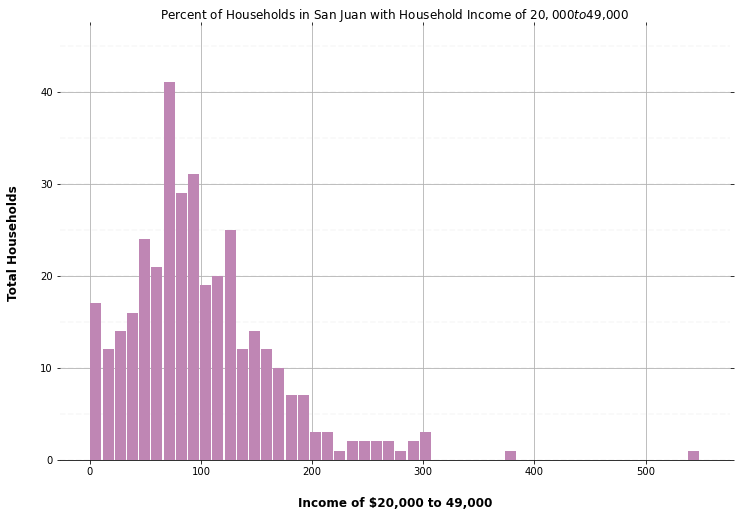

In [30]:
ax = df.hist(column='Percent Households with $20,000 to $49,999', bins=50, grid=True, figsize=(12,8), color='#bf86b4', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Households in San Juan with Household Income of $20,000 to $49,000")

    # Set x-axis label
    x.set_xlabel("Income of $20,000 to 49,000", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

NameError: name 'StrMethodFormatter' is not defined

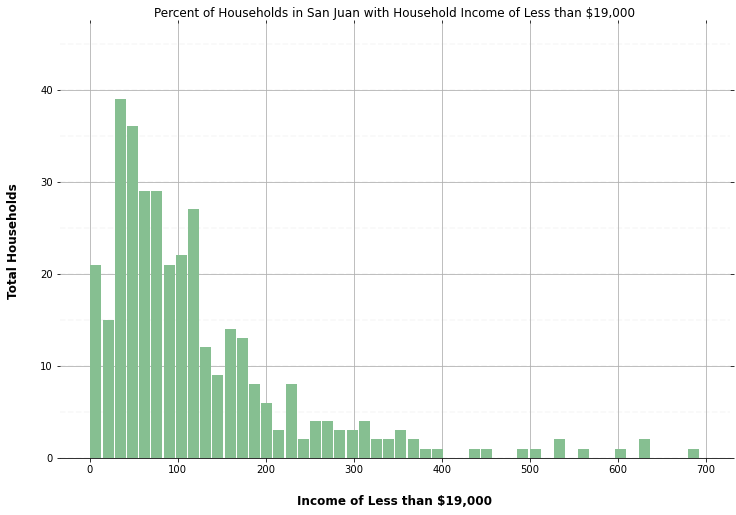

In [31]:
ax = df.hist(column='Percent Households with Less than $19,000', bins=50, grid=True, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Households in San Juan with Household Income of Less than $19,000")

    # Set x-axis label
    x.set_xlabel("Income of Less than $19,000", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

NameError: name 'StrMethodFormatter' is not defined

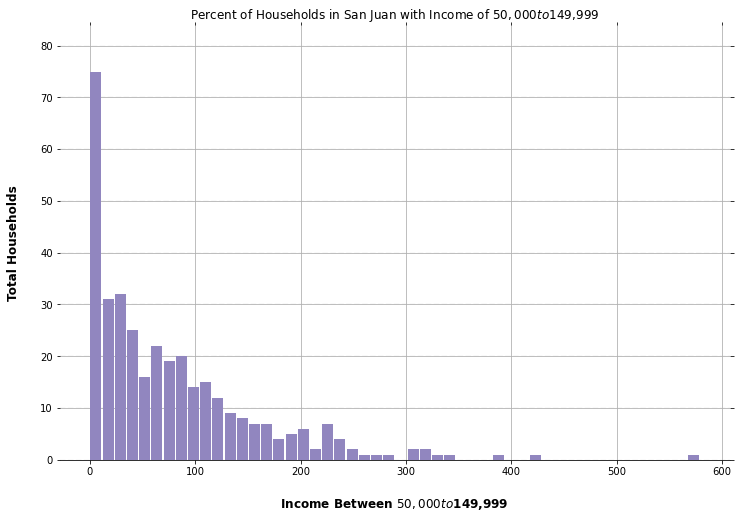

In [32]:
ax = df.hist(column='Percent Households with $50,000 to $149,999', bins=50, grid=True, figsize=(12,8), color='#9186bf', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Households in San Juan with Income of $50,000 to $149,999")

    # Set x-axis label
    x.set_xlabel("Income Between $50,000 to $149,999", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

NameError: name 'StrMethodFormatter' is not defined

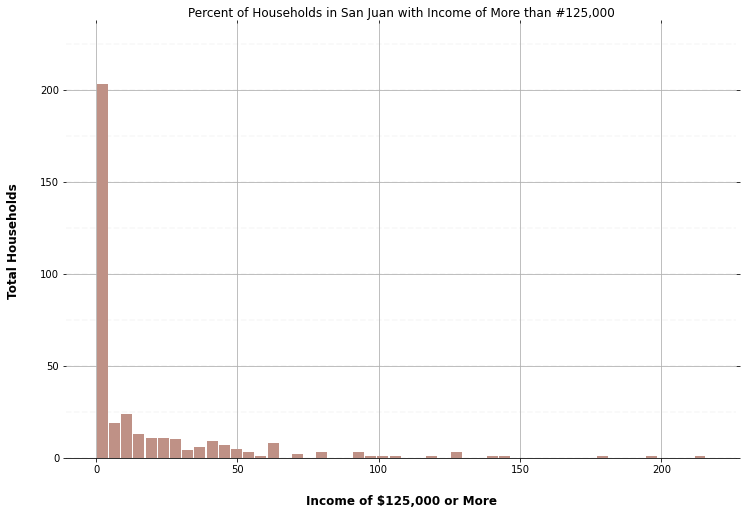

In [33]:
ax = df.hist(column='Percent Households with More than $125,000', bins=50, grid=True, figsize=(12,8), color='#bf9186', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Households in San Juan with Income of More than #125,000")

    # Set x-axis label
    x.set_xlabel("Income of $125,000 or More", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

I created new rows that include several income groups based on guidelines for class (<$19,000=poverty; 20,000-49,000=low income; 50,000-149,999=middle income; $125,000>=high income. These graphs show what the data looks like.

##### Maps

Text(0.5, 1.0, 'Percent Households with more than #125,000')

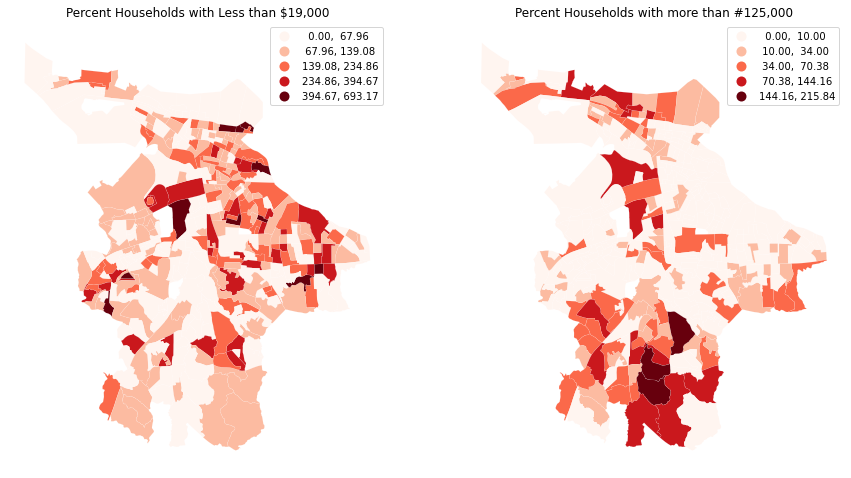

In [34]:
# create the 1x2 subplots
# set sharex and sharey to true to scale each map equally
fig, axs = plt.subplots(1, 2, figsize=(15, 12), sharex=True, sharey=True)

# name each subplot
ax1, ax2 = axs

# percent households with Less than $19,000 on the left
df.plot(column='Percent Households with Less than $19,000', 
            cmap='Reds', 
            scheme='NaturalBreaks',
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Percent Households with Less than $19,000")

#  Percent Households with more than $125,000 map on the right
df.plot(column='Percent Households with More than $125,000', 
            cmap='Reds', 
            scheme='NaturalBreaks',
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Percent Households with more than #125,000")

These maps visualize the income distribution in San Juan. I've used gradients so it's more visually appealing.

##### Adding Basemaps

In [35]:
# reproject to Web Mercator
df_web_mercator = df.to_crs(epsg=3857)

In [36]:
list(df)

['geoid',
 'name',
 'Total',
 'Less than $10,000',
 '$10,000 to $14,999',
 '$15,000 to $19,999',
 '$20,000 to $24,999',
 '$25,000 to $29,999',
 '$30,000 to $34,999',
 '$35,000 to $39,999',
 '$40,000 to $44,999',
 '$45,000 to $49,999',
 '$50,000 to $59,999',
 '$60,000 to $74,999',
 '$75,000 to $99,999',
 '$100,000 to $124,999',
 '$125,000 to $149,999',
 '$150,000 to $199,999',
 '$200,000 or more',
 'geometry',
 'Percent Households with Less than $10,000',
 'Percent Households with $15,000 to $19,999',
 'Percent Households with $20,000 to $24,999',
 'Percent Households with $25,000 to $29,999',
 'Percent Households with $30,000 to $34,999',
 'Percent Households with $35,000 to $39,999',
 'Percent Households with $40,000 to $44,999',
 'Percent Households with $45,000 to $49,999',
 'Percent Households with $50,000 to $59,999',
 'Percent Households with $60,000 to $74,999',
 'Percent Households with $75,000 to $99,999',
 'Percent Households with $100,000 to $124,999',
 'Percent Houselholds 

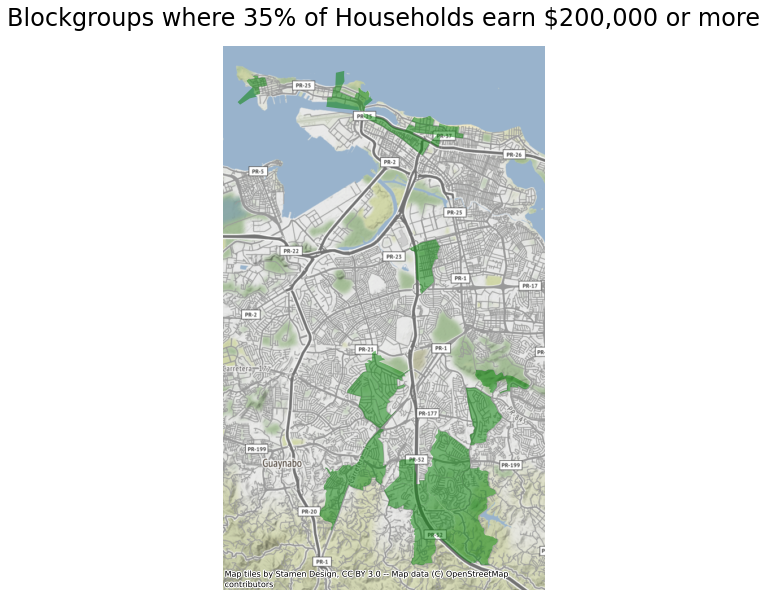

In [37]:
fig, ax = plt.subplots(figsize=(10, 10))

# add the layer with ax=ax in the argument 
df_web_mercator[df_web_mercator['$200,000 or more'] > 35].plot(
                                                               ax=ax, 
                                                               color="green",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 35% of Households earn $200,000 or more',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

In [38]:
df.head()

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999",...,"Percent Households with $60,000 to $74,999","Percent Households with $75,000 to $99,999","Percent Households with $100,000 to $124,999","Percent Houselholds with $125,000 to $149,999","Percent Households with $150,000 to $199,999","Percent Households with $200,000 or more","Percent Households with Less than $19,000","Percent Households with $20,000 to $49,999","Percent Households with $50,000 to $149,999","Percent Households with More than $125,000"
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,...,0.000000,2.250804,2.250804,8.360129,5.787781,4.501608,73.501608,85.572347,43.360129,48.501608
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,...,0.000000,4.419890,0.000000,0.000000,2.762431,5.801105,80.917127,130.077348,54.000000,15.801105
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,...,4.989605,6.444906,11.434511,0.000000,2.702703,8.108108,51.444906,125.573805,141.000000,21.108108
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,155.773585,30.000000,29.000000,0.000000
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,...,9.160305,8.778626,13.358779,6.870229,13.358779,10.687023,43.488550,23.290076,100.870229,63.687023


In [39]:
#these are the columns I had last time. I am going to create some new columns that go with guidelines for poverty.
df['Less than $19,000']=df['Less than $10,000']+ df['$15,000 to $19,999']
df['$20,000 to $49,999']=df['$20,000 to $24,999']+ df['$25,000 to $29,999']+ df['$30,000 to $34,999']+ df['$35,000 to $39,999']+ df['$40,000 to $44,999']+ df['$45,000 to $49,999']
df['$50,000 to $149,999']=df['$50,000 to $59,999']+df['$60,000 to $74,999']+df['$75,000 to $99,999']+df['$100,000 to $124,999']+ df['$125,000 to $149,999']
df['More than $125,000']= df['$125,000 to $149,999']+df['$150,000 to $199,999']+df['$200,000 or more']

In [40]:
df.head()

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999",...,"Percent Households with $150,000 to $199,999","Percent Households with $200,000 or more","Percent Households with Less than $19,000","Percent Households with $20,000 to $49,999","Percent Households with $50,000 to $149,999","Percent Households with More than $125,000","Less than $19,000","$20,000 to $49,999","$50,000 to $149,999","More than $125,000"
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,...,5.787781,4.501608,73.501608,85.572347,43.360129,48.501608,83.0,91.0,61.0,58.0
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,...,2.762431,5.801105,80.917127,130.077348,54.000000,15.801105,120.0,146.0,54.0,31.0
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,...,2.702703,8.108108,51.444906,125.573805,141.000000,21.108108,76.0,143.0,141.0,52.0
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,...,0.000000,0.000000,155.773585,30.000000,29.000000,0.000000,162.0,30.0,29.0,0.0
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,...,13.358779,10.687023,43.488550,23.290076,100.870229,63.687023,54.0,27.0,112.0,81.0


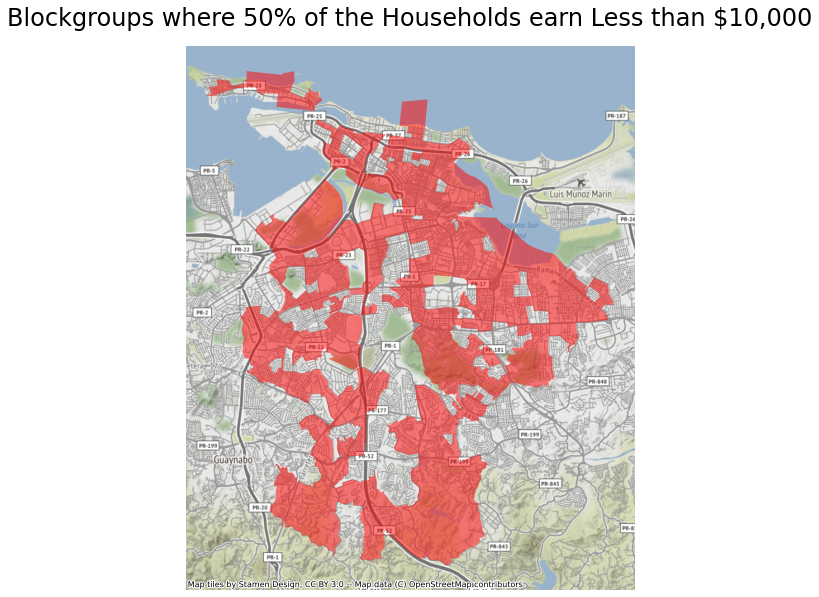

In [41]:
fig, ax = plt.subplots(figsize=(10, 10))

# add the layer with ax=ax in the argument 
df_web_mercator[df_web_mercator['Less than $10,000'] > 50].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 50% of the Households earn Less than $10,000',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

These are maps that show blockgroups and income.I did this last time too.

In [42]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

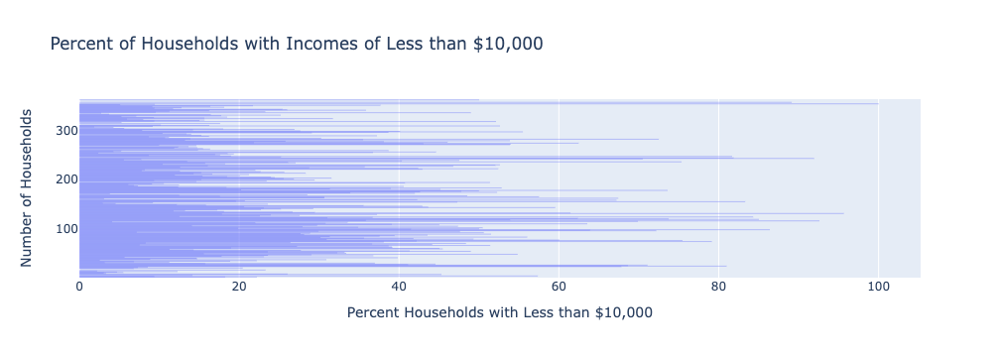

In [43]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(df,
       x='Percent Households with Less than $10,000',
       title='Percent of Households with Incomes of Less than $10,000 ', labels= {'Percent Households with Less than $10,000':'Percent Households with Less than $10,000',
            'index':'Number of Households'}
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

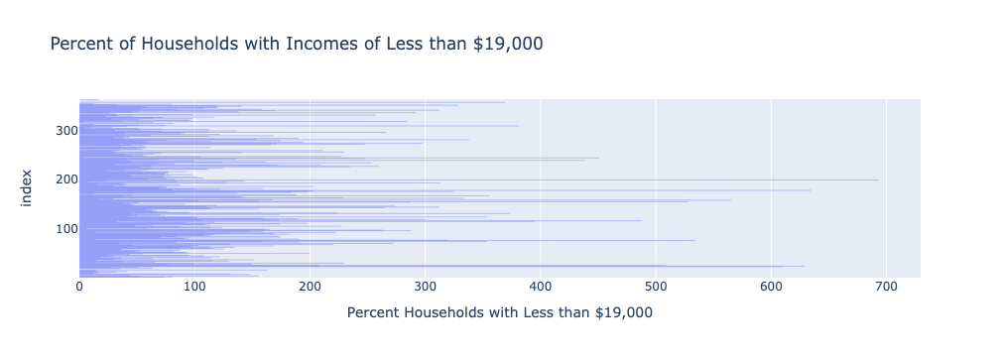

In [44]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(df,
       x='Percent Households with Less than $19,000',
       title='Percent of Households with Incomes of Less than $19,000'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

#### Race

By now, I have seen the average income in San Juan. Now, I want to see how that is divided by ethnicity. While in my proposal I've spoken about race not being a good indicator of gentrification in Puerto Rico because of how problematic the concept is, I believe showing ethnicity (non-Hispanic vs. Hispanic) will be beneficial. Puerto Ricans, with very little variation, identify as Hispanics. Migration to Puerto Rico from non-Hispanics (US Whites and Blacks) might be visible here, thus a sign of gentrification.

ps: this is also for 2019 (5-year ACS), for blockgroups in San Juan too.

Ryan pointed out this might be problematic, so I plan to explore how to make it better.

In [45]:
#loading my data
gdf = gpd.read_file('acs2019_san juan_race.geojson')

In [46]:
#data types
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             365 non-null    object  
 1   name              365 non-null    object  
 2   B03002001         365 non-null    float64 
 3   B03002001, Error  365 non-null    float64 
 4   B03002002         365 non-null    float64 
 5   B03002002, Error  365 non-null    float64 
 6   B03002003         365 non-null    float64 
 7   B03002003, Error  365 non-null    float64 
 8   B03002004         365 non-null    float64 
 9   B03002004, Error  365 non-null    float64 
 10  B03002005         365 non-null    float64 
 11  B03002005, Error  365 non-null    float64 
 12  B03002006         365 non-null    float64 
 13  B03002006, Error  365 non-null    float64 
 14  B03002007         365 non-null    float64 
 15  B03002007, Error  365 non-null    float64 
 16  B03002008         

In [47]:
# drop the row with index 0 (i.e. the first row)
gdf = gdf.drop([0])

In [48]:
gdf.head()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",647.0,178.0,66.0,63.0,22.0,24.0,37.0,58.0,...,14.0,6.0,10.0,55.0,75.0,0.0,14.0,55.0,75.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",589.0,156.0,104.0,72.0,104.0,72.0,0.0,14.0,...,14.0,34.0,37.0,40.0,39.0,10.0,14.0,30.0,39.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",926.0,243.0,61.0,81.0,61.0,81.0,0.0,14.0,...,14.0,31.0,34.0,147.0,147.0,11.0,16.0,136.0,147.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",630.0,173.0,0.0,14.0,0.0,14.0,0.0,14.0,...,14.0,59.0,86.0,84.0,74.0,0.0,14.0,84.0,74.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",647.0,168.0,52.0,38.0,39.0,32.0,13.0,19.0,...,14.0,25.0,30.0,89.0,119.0,0.0,14.0,89.0,119.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [49]:
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002010',
 'B03002011',
 'B03002012',
 'B03002013',
 'B03002014',
 'B03002015',
 'B03002016',
 'B03002017',
 'B03002018',
 'B03002019',
 'B03002020',
 'B03002021',
 'geometry']

In [50]:
# redefine gdf with only columns to keep
gdf = gdf[columns_to_keep]

In [51]:
#rename
gdf.columns = ['geoid',
'name',
'Total',
'Not Hispanic or Latino',
'White alone',
'Black or African American alone',
'American Indian and Alaska Native alone',
'Asian alone',
'Native Hawaiian and Other Pacific Islander alone',
'Some other race alone',
'Two or more races',
'Two races including Some other race',
'Two races excluding Some other race, and three or more races',
'Hispanic or Latino',
'White alone',
'Black or African American alone',
'American Indian and Alaska Native alone',
'Asian alone',
'Native Hawaiian and Other Pacific Islander alone',
'Some other race alone',
'Two or more races',
'Two races including Some other race',
'Two races excluding Some other race, and three or more races',
'geometry']

In [52]:
gdf_sorted = df.sort_values(by='Total',ascending = False)

In [53]:
df_sorted[['geoid','Total']].head(10)

,geoid,Total
364,16000US7276770,138385.0
199,15000US721270068001,2334.0
345,15000US721270100421,1100.0
316,15000US721270098005,1062.0
340,15000US721270100222,1023.0
334,15000US721270100022,1001.0
331,15000US721270100013,998.0
281,15000US721270091112,930.0
234,15000US721270080011,925.0
239,15000US721270080023,909.0


In [54]:
gdf = gdf.drop([364])

<AxesSubplot:>

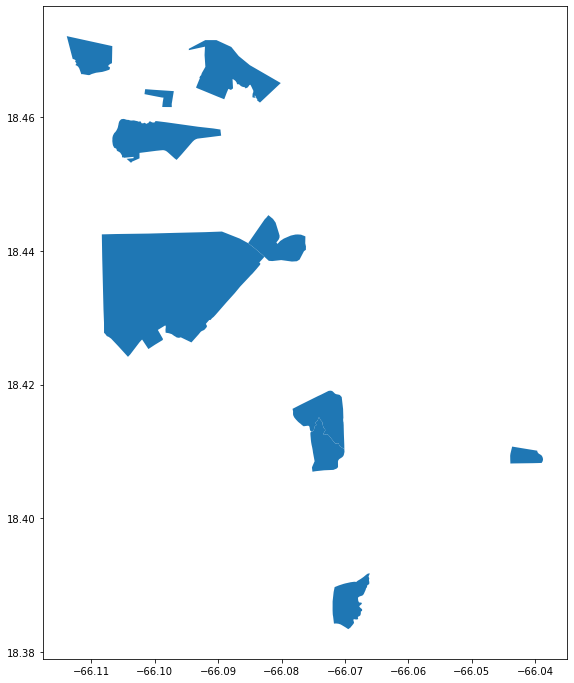

In [55]:
# plotting the highest population
df_sorted.tail(10).plot(figsize=(12,12))

In [56]:
#i am going to normalize the data now
list(gdf)

['geoid',
 'name',
 'Total',
 'Not Hispanic or Latino',
 'White alone',
 'Black or African American alone',
 'American Indian and Alaska Native alone',
 'Asian alone',
 'Native Hawaiian and Other Pacific Islander alone',
 'Some other race alone',
 'Two or more races',
 'Two races including Some other race',
 'Two races excluding Some other race, and three or more races',
 'Hispanic or Latino',
 'White alone',
 'Black or African American alone',
 'American Indian and Alaska Native alone',
 'Asian alone',
 'Native Hawaiian and Other Pacific Islander alone',
 'Some other race alone',
 'Two or more races',
 'Two races including Some other race',
 'Two races excluding Some other race, and three or more races',
 'geometry']

In [57]:
gdf['Percent Not Hispanic'] = gdf['Not Hispanic or Latino']/gdf['Total']*100
gdf['Percent Hispanic'] = gdf['Hispanic or Latino']/gdf['Total']*100

In [58]:
list(gdf)

['geoid',
 'name',
 'Total',
 'Not Hispanic or Latino',
 'White alone',
 'Black or African American alone',
 'American Indian and Alaska Native alone',
 'Asian alone',
 'Native Hawaiian and Other Pacific Islander alone',
 'Some other race alone',
 'Two or more races',
 'Two races including Some other race',
 'Two races excluding Some other race, and three or more races',
 'Hispanic or Latino',
 'White alone',
 'Black or African American alone',
 'American Indian and Alaska Native alone',
 'Asian alone',
 'Native Hawaiian and Other Pacific Islander alone',
 'Some other race alone',
 'Two or more races',
 'Two races including Some other race',
 'Two races excluding Some other race, and three or more races',
 'geometry',
 'Percent Not Hispanic',
 'Percent Hispanic']

In [59]:
gdf.head()

,geoid,name,Total,Not Hispanic or Latino,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some other race alone,...,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some other race alone,Two or more races,Two races including Some other race,"Two races excluding Some other race, and three or more races",geometry,Percent Not Hispanic,Percent Hispanic
1,15000US721270004002,"Block Group 2, San Juan, PR",647.0,66.0,22.0,37.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,55.0,0.0,55.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ...",10.200927,89.799073
2,15000US721270005061,"Block Group 1, San Juan, PR",589.0,104.0,104.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,34.0,40.0,10.0,30.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ...",17.657046,82.342954
3,15000US721270005062,"Block Group 2, San Juan, PR",926.0,61.0,61.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,31.0,147.0,11.0,136.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ...",6.587473,93.412527
4,15000US721270006001,"Block Group 1, San Juan, PR",630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,59.0,84.0,0.0,84.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ...",0.000000,100.000000
5,15000US721270006002,"Block Group 2, San Juan, PR",647.0,52.0,39.0,13.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,25.0,89.0,0.0,89.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ...",8.037094,91.962906


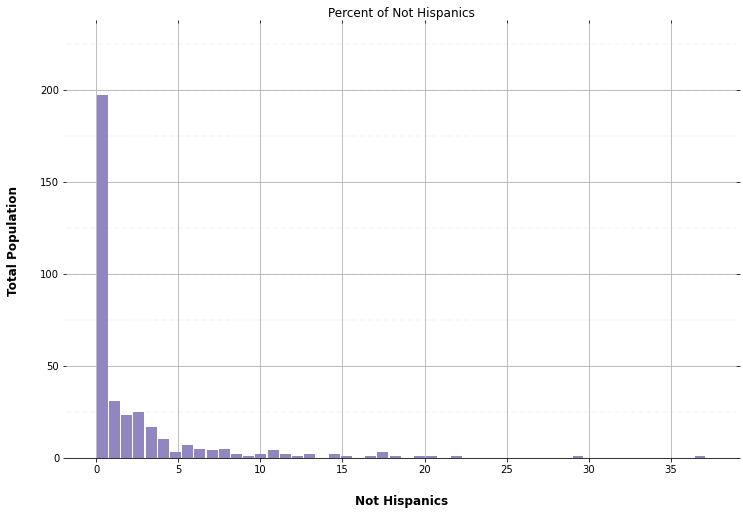

In [60]:
ax = gdf.hist(column='Percent Not Hispanic', bins=50, grid=True, figsize=(12,8), color='#9186bf', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Not Hispanics")

    # Set x-axis label
    x.set_xlabel("Not Hispanics", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Population", labelpad=20, weight='bold', size=12)

    # Format y-axis label

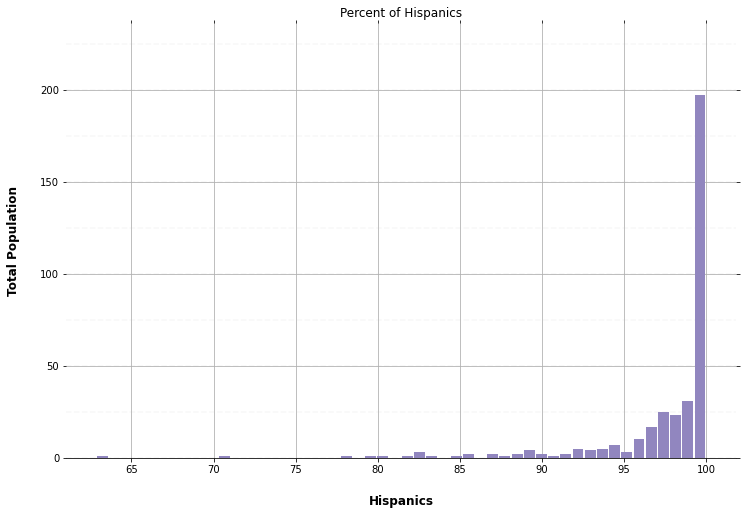

In [61]:
ax = gdf.hist(column='Percent Hispanic', bins=50, grid=True, figsize=(12,8), color='#9186bf', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Hispanics")

    # Set x-axis label
    x.set_xlabel("Hispanics", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Population", labelpad=20, weight='bold', size=12)

    # Format y-axis label

Text(0.5, 1.0, 'Percent of Not Hispanics')

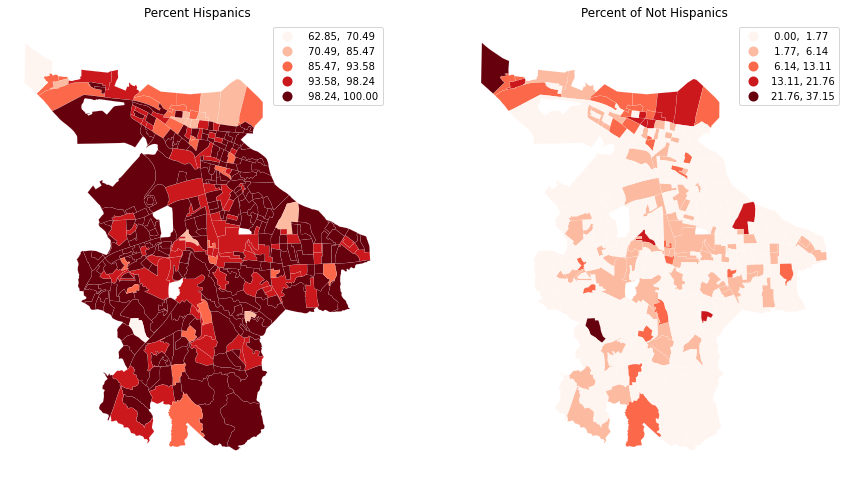

In [62]:
# create the 1x2 subplots
# set sharex and sharey to true to scale each map equally
fig, axs = plt.subplots(1, 2, figsize=(15, 12), sharex=True, sharey=True)

# name each subplot
ax1, ax2 = axs

# percent hispanics
gdf.plot(column='Percent Hispanic', 
            cmap='Reds', 
            scheme='NaturalBreaks',
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Percent Hispanics")

#  Percent not hispanics
gdf.plot(column='Percent Not Hispanic', 
            cmap='Reds', 
            scheme='NaturalBreaks',
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Percent of Not Hispanics")

This is a very useful graph that I didn't have the first time. I am still figuring out how to run it with Non Hispanic Whites.

In [64]:
# reproject to Web Mercator
gdf_web_mercator = gdf.to_crs(epsg=3857)

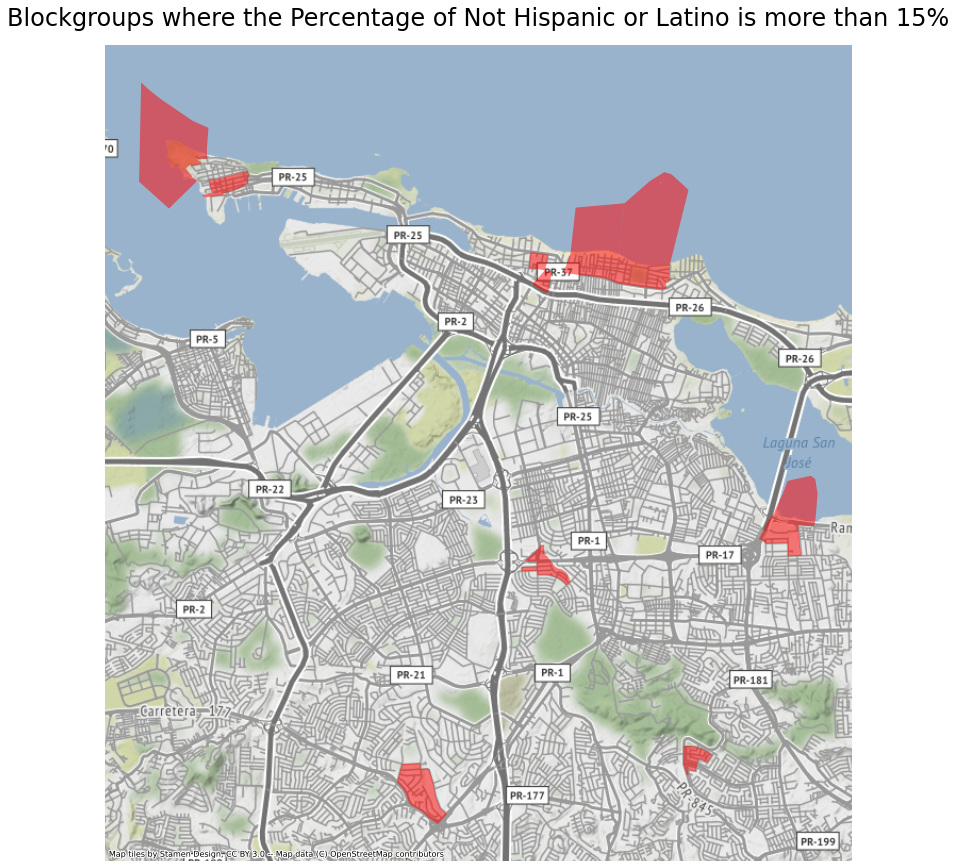

In [65]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
gdf_web_mercator[gdf_web_mercator['Percent Not Hispanic'] > 15].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where the Percentage of Not Hispanic or Latino is more than 15%',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

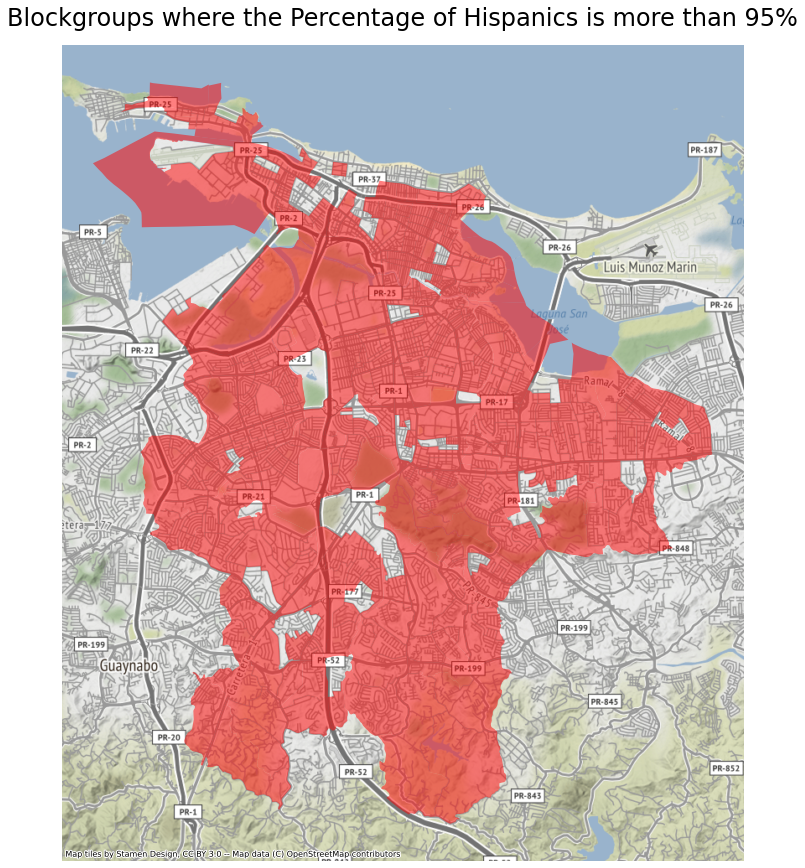

In [66]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
gdf_web_mercator[gdf_web_mercator['Percent Hispanic'] > 95].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where the Percentage of Hispanics is more than 95%',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

/opt/conda/lib/python3.9/site-packages/contextily/tile.py:581: UserWarning:

The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 18).



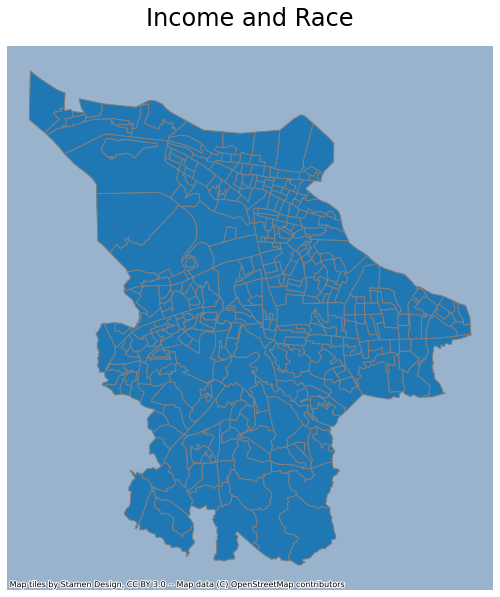

In [68]:
fig, ax =plt.subplots(figsize=(10,10))

df.plot (ax=ax,
         linewidth=0.5,
         edgecolor='grey',
         zorder=10)
         
gdf.plot (ax=ax,
          edgecolor='grey',
         zorder=10)

ax.axis('off')

ax.set_title('Income and Race', fontsize=24, pad=20)
          
ctx.add_basemap(ax)

I hadn't been able to run this one last time, but Ryan pointed out the error. It ran but there's something missing here...

### Creating a Loop

In [88]:
# this is my attempt at creating a loop. Elena suggested I could create Open Street Maps to track tourism, so I will take this opportunity to do so and hopefully create a loop too.  

In [89]:
# to download osm data
import osmnx as ox

# to manipulate data
import pandas as pd

# to manipulate and visualize spatial data
import geopandas as gpd

# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

In [90]:
address = 'San Juan, PR'

In [92]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# get the data from OSM that are tagged as 'building' for a 1000m X 1000m square area
osm = ox.geometries_from_address(address,tags={'building':True},dist=1000)

CPU times: user 487 ms, sys: 14.5 ms, total: 501 ms
Wall time: 3.73 s


In [94]:
# show me 10 random rows
osm.sample(10)

nodes  \
element_type osmid                                                          
way          385611181  [3889473503, 3889473504, 3889473506, 388947350...   
             385611169  [3889473493, 3889473492, 3889473496, 388947349...   
             385611188  [3889473464, 3889473466, 3889473472, 388947347...   
             385610560  [3889465732, 3889465734, 3889465737, 388946573...   
             385611177  [3889473456, 3889473452, 3889473458, 388947346...   
             385611179  [3889473483, 3889473482, 3889473486, 388947348...   
             385610519  [3889465717, 3889465718, 3889465721, 388946571...   
             385611190  [3889473474, 3889473473, 3889473477, 388947347...   
             385611171  [3889473451, 3889473455, 3889473462, 388947345...   
             385611173  [3889473476, 3889473475, 3889473479, 388947348...   

                       amenity building religion  \
element_type osmid                                 
way          385611181     NaN      yes      NaN   
             385611169     NaN      yes      NaN   
             385611188     NaN      yes      NaN   
             385610560     NaN      yes      NaN   
             385611177     NaN      yes      NaN   
             385611179     NaN      yes      NaN   
             385610519     NaN      yes      NaN   
             385611190     NaN      yes      NaN   
             385611171     NaN      yes      NaN   
             385611173     NaN      yes      NaN   

                                                                 geometry  
element_type osmid                                                         
way          385611181  POLYGON ((-77.62944 -8.66226, -77.62939 -8.662...  
             385611169  POLYGON ((-77.63006 -8.66142, -77.63001 -8.661...  
             385611188  POLYGON ((-77.63066 -8.66043, -77.63063 -8.660...  
             385610560  POLYGON ((-77.63380 -8.66041, -77.63374 -8.660...  
             385611177  POLYGON ((-77.63062 -8.66037, -77.63058 -8.660...  
             385611179  POLYGON ((-77.63133 -8.66080, -77.63126 -8.660...  
             385610519  POLYGON ((-77.63430 -8.66006, -77.63425 -8.660...  
             385611190  POLYGON ((-77.63115 -8.66066, -77.63111 -8.660...  
             385611171  POLYGON ((-77.63392 -8.66033, -77.63388 -8.660...  
             385611173  POLYGON ((-77.63128 -8.66069, -77.63121 -8.660...

In [95]:
# Get a full list of columns
list(osm)

['nodes', 'amenity', 'building', 'religion', 'geometry']

In [96]:
#lots of NaN.
columns_to_keep = ['geometry','building','nodes']
osm = osm[columns_to_keep]

In [97]:
osm.sample(10)

geometry  \
element_type osmid                                                          
way          385611184  POLYGON ((-77.63393 -8.66044, -77.63387 -8.660...   
             385610560  POLYGON ((-77.63380 -8.66041, -77.63374 -8.660...   
             385610617  POLYGON ((-77.63366 -8.66049, -77.63361 -8.660...   
             385611179  POLYGON ((-77.63133 -8.66080, -77.63126 -8.660...   
             385611186  POLYGON ((-77.63407 -8.66023, -77.63399 -8.660...   
             385611173  POLYGON ((-77.63128 -8.66069, -77.63121 -8.660...   
             385610513  POLYGON ((-77.63377 -8.66019, -77.63372 -8.660...   
             385611181  POLYGON ((-77.62944 -8.66226, -77.62939 -8.662...   
             385611189  POLYGON ((-77.63147 -8.66082, -77.63142 -8.660...   
             385610597  POLYGON ((-77.63360 -8.66039, -77.63346 -8.660...   

                       building  \
element_type osmid                
way          385611184      yes   
             385610560      yes   
             385610617      yes   
             385611179      yes   
             385611186      yes   
             385611173      yes   
             385610513   church   
             385611181      yes   
             385611189      yes   
             385610597      yes   

                                                                    nodes  
element_type osmid                                                         
way          385611184  [3889473465, 3889473468, 3889473470, 388947346...  
             385610560  [3889465732, 3889465734, 3889465737, 388946573...  
             385610617  [3889465736, 3889465738, 3889465740, 388946573...  
             385611179  [3889473483, 3889473482, 3889473486, 388947348...  
             385611186  [3889473448, 3889473449, 3889473453, 388947345...  
             385611173  [3889473476, 3889473475, 3889473479, 388947348...  
             385610513  [3889465723, 3889465720, 3889465725, 388946572...  
             385611181  [3889473503, 3889473504, 3889473506, 388947350...  
             385611189  [3889473485, 3889473484, 3889473488, 388947348...  
             385610597  [3889465731, 3889465726, 3889465727, 388946573...

In [98]:
osm_building_counts = osm.building.value_counts()
osm_building_counts

yes       18
church     1
Name: building, dtype: int64

In [100]:
#Why this data has a church? This also seems very small (only 18 buildings. I might want to do all PR...)

In [101]:
# convert it into a dataframe
df_osm_building_types = pd.DataFrame(osm_building_counts)
df_osm_building_types

,building
yes,18
church,1


In [102]:
# reset the index
df_osm_building_types = df_osm_building_types.reset_index()
df_osm_building_types

,index,building
0,yes,18
1,church,1


In [103]:
df_osm_building_types.columns = ['building_type','count']
df_osm_building_types

,building_type,count
0,yes,18
1,church,1


<AxesSubplot:>

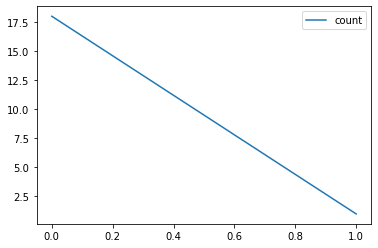

In [104]:
df_osm_building_types.plot()

<AxesSubplot:ylabel='building_type'>

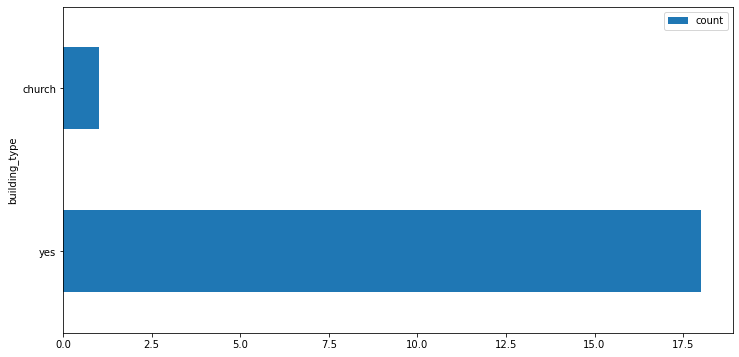

In [105]:
df_osm_building_types.plot.barh(figsize=(12,6),
                                x='building_type')

In [106]:
#yes so let me do PR instead 

In [125]:
address = 'San Juan, Puerto Rico, USA'

In [126]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# get the data from OSM that are tagged as 'building' for a 1000m X 1000m square area
osm = ox.geometries_from_address(address,tags={'building':True},dist=1000)

CPU times: user 557 ms, sys: 17.9 ms, total: 575 ms
Wall time: 6.12 s


In [127]:
# show me 10 random rows
osm.sample(10)

building  ele gnis:county_name gnis:feature_id  \
element_type osmid                                                      
relation     3614163        yes  NaN              NaN             NaN   
way          269739382      yes  NaN              NaN             NaN   
             260838196      yes  NaN              NaN             NaN   
             259840377      yes  NaN              NaN             NaN   
             260838200      yes  NaN              NaN             NaN   
             262893143      yes  NaN              NaN             NaN   
             292447054      yes  NaN              NaN             NaN   
             259840336      yes  NaN              NaN             NaN   
             259840387      yes  NaN              NaN             NaN   
             269744540      yes  NaN              NaN             NaN   

                       gnis:import_uuid gnis:reviewed               name  \
element_type osmid                                                         
relation     3614163                NaN           NaN                NaN   
way          269739382              NaN           NaN  Museo Casa Blanca   
             260838196              NaN           NaN                NaN   
             259840377              NaN           NaN                NaN   
             260838200              NaN           NaN                NaN   
             262893143              NaN           NaN                NaN   
             292447054              NaN           NaN    Capitolio Plaza   
             259840336              NaN           NaN                NaN   
             259840387              NaN           NaN                NaN   
             269744540              NaN           NaN                NaN   

                       source  \
element_type osmid              
relation     3614163      NaN   
way          269739382    NaN   
             260838196    NaN   
             259840377    NaN   
             260838200    NaN   
             262893143    NaN   
             292447054    NaN   
             259840336    NaN   
             259840387    NaN   
             269744540    NaN   

                                                                 geometry  \
element_type osmid                                                          
relation     3614163    POLYGON ((-66.11722 18.46773, -66.11713 18.467...   
way          269739382  POLYGON ((-66.12006 18.46686, -66.12028 18.467...   
             260838196  POLYGON ((-66.11465 18.46528, -66.11451 18.465...   
             259840377  POLYGON ((-66.11302 18.46767, -66.11307 18.467...   
             260838200  POLYGON ((-66.11443 18.46533, -66.11435 18.465...   
             262893143  POLYGON ((-66.11244 18.46717, -66.11257 18.467...   
             292447054  POLYGON ((-66.10696 18.46495, -66.10696 18.465...   
             259840336  POLYGON ((-66.11270 18.46751, -66.11278 18.467...   
             259840387  POLYGON ((-66.11303 18.46779, -66.11303 18.467...   
             269744540  POLYGON ((-66.11792 18.46820, -66.11781 18.468...   

                       amenity  ... tourism_1          type government  \
element_type osmid              ...                                      
relation     3614163       NaN  ...       NaN  multipolygon        NaN   
way          269739382     NaN  ...       NaN           NaN        NaN   
             260838196     NaN  ...       NaN           NaN        NaN   
             259840377     NaN  ...       NaN           NaN        NaN   
             260838200     NaN  ...       NaN           NaN        NaN   
             262893143     NaN  ...       NaN           NaN        NaN   
             292447054     NaN  ...       NaN           NaN        NaN   
             259840336     NaN  ...       NaN           NaN        NaN   
             259840387     NaN  ...       NaN           NaN        NaN   
             269744540     NaN  ...       NaN           NaN        NaN   

                      

In [128]:
# Get a full list of columns
list(osm)

['building',
 'ele',
 'gnis:county_name',
 'gnis:feature_id',
 'gnis:import_uuid',
 'gnis:reviewed',
 'name',
 'source',
 'geometry',
 'amenity',
 'addr:housenumber',
 'addr:street',
 'alt_name',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'description',
 'official_name',
 'operator',
 'short_name',
 'artwork_type',
 'name:en',
 'name:es',
 'tourism',
 'nodes',
 'building:levels',
 'historic',
 'access',
 'capacity',
 'parking',
 'castle_type',
 'height',
 'wheelchair',
 'wikidata',
 'wikipedia',
 'wikipedia:en',
 'addr:city',
 'addr:state',
 'addr:postcode',
 'level',
 'religion',
 'office',
 'opening_hours',
 'shop',
 'cuisine',
 'denomination',
 'delivery',
 'drive_through',
 'fast_food',
 'outdoor_seating',
 'smoking',
 'takeaway',
 'abandoned',
 'healthcare',
 'addr:housename',
 'supervised',
 'website',
 'alt_name:en',
 'alt_name:es',
 'brand:en',
 'brand:es',
 'official_name:es',
 'denomination_1',
 'phone',
 'old_name',
 'man_made',
 'abandoned:building',
 'addr:number',


In [129]:
columns_to_keep = ['geometry','building','nodes', 'tourism_1']
osm = osm[columns_to_keep]

In [130]:
osm_building_counts = osm.building.value_counts()
osm_building_counts

yes             1241
construction       5
garage             4
service            4
school             3
house              3
university         2
cathedral          2
public             1
office             1
apartments         1
church             1
warehouse          1
commercial         1
hospital           1
Name: building, dtype: int64

In [136]:
df_osm_building_types.columns = ['building_type','count']
df_osm_building_types

,building_type,count
0,yes,1241
1,construction,5
2,garage,4
3,service,4
4,school,3
5,house,3
6,university,2
7,cathedral,2
8,public,1
9,office,1


In [132]:
# convert it into a dataframe
df_osm_building_types = pd.DataFrame(osm_building_counts)
df_osm_building_types

,building
yes,1241
construction,5
garage,4
service,4
school,3
house,3
university,2
cathedral,2
public,1
office,1


In [133]:
# reset the index
df_osm_building_types = df_osm_building_types.reset_index()
df_osm_building_types

,index,building
0,yes,1241
1,construction,5
2,garage,4
3,service,4
4,school,3
5,house,3
6,university,2
7,cathedral,2
8,public,1
9,office,1


<AxesSubplot:>

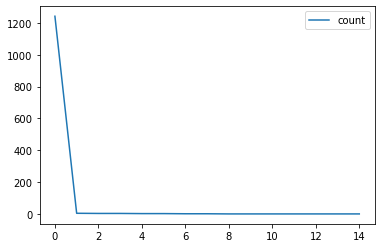

In [137]:
df_osm_building_types.plot()

<AxesSubplot:ylabel='building_type'>

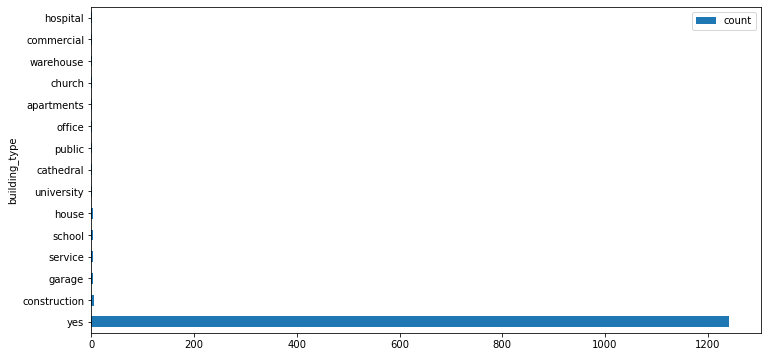

In [138]:
df_osm_building_types.plot.barh(figsize=(12,6),
                                x='building_type')

<AxesSubplot:>

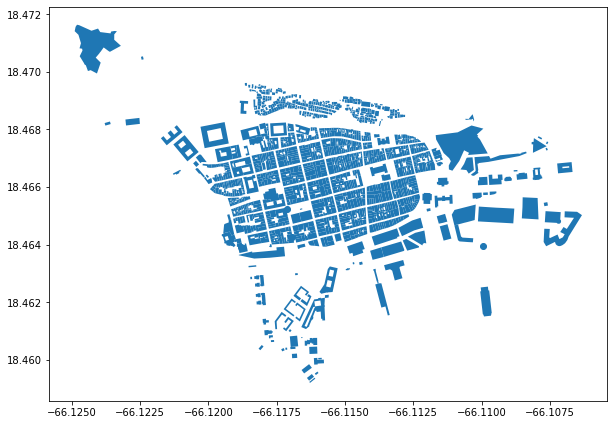

In [139]:
# plot entire dataset
osm.plot(figsize=(10,10))

<AxesSubplot:>

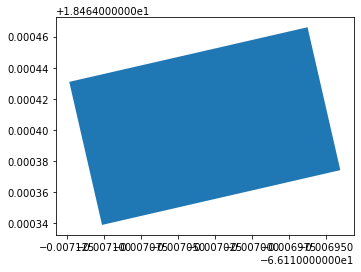

In [140]:
# plot a single random building
osm.sample(1).plot()

<AxesSubplot:>

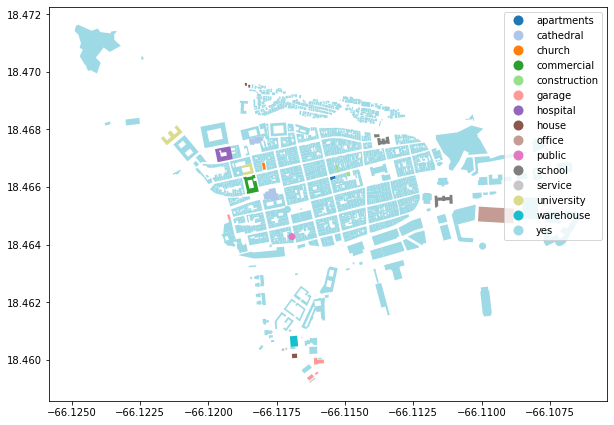

In [141]:
osm.plot(figsize=(10,10),
         column='building',
         cmap='tab20',
         legend=True)

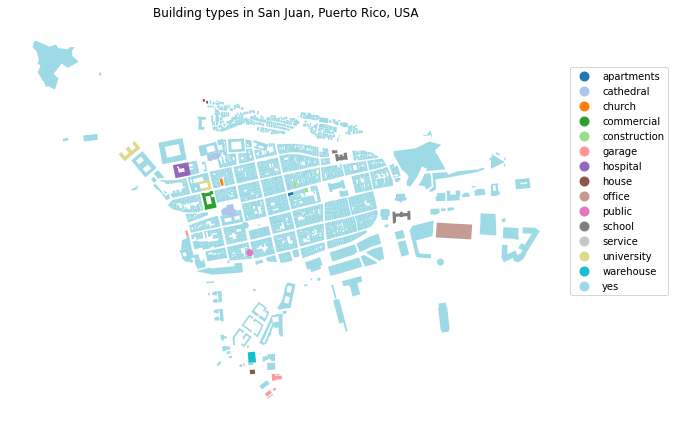

In [142]:
fig, ax = plt.subplots(figsize=(10,10))

# create the map plot
osm.plot(ax=ax,
         column='building',
         cmap='tab20',
         legend=True,
         legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)})

# add a title
ax.set_title('Building types in ' + address)

# get rid of the axis
ax.axis('off');

In [143]:
# reproject to Web Mercator
osm_web_mercator = osm.to_crs(epsg=3857)

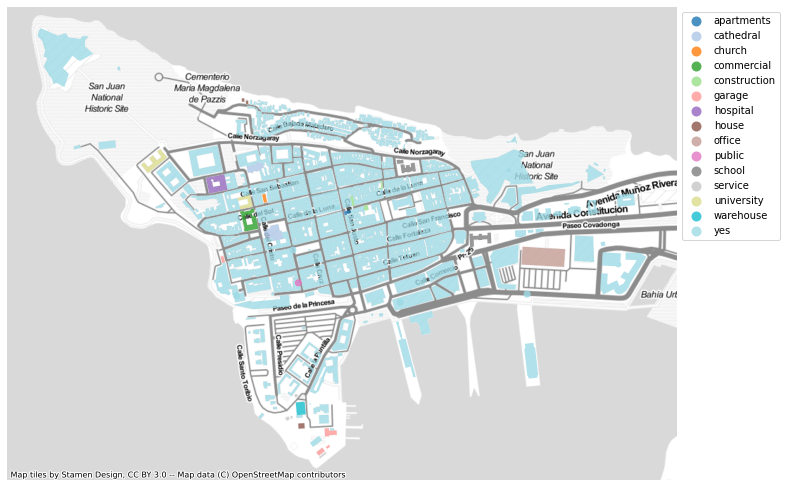

In [144]:
fig,ax = plt.subplots(figsize=(12,12))

osm_web_mercator.plot(ax=ax,
                    column='building',
                    cmap='tab20',
                    legend=True,
                    alpha=0.8,
                    legend_kwds={'loc':'upper left','bbox_to_anchor':(1,1)})

# get rid of the axis
ax.axis('off');

# basemap from carto that has a dark background (easier to see)
ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

In [145]:
#Well this is pretty cool! it's mostly yeses of course but there's somr other things. And it ran so that's still surprising lol. THis data also has some tourism data? I need to check that.

In [146]:
# this is my attempt at creating a loop
def make_building_map(location):
    
    # get the data from osm
    osm = ox.geometries_from_address(location,
                                     tags={'building':True},
                                     dist=1000)
    
    # reproject to Web Mercator
    osm_web_mercator = osm.to_crs(epsg=3857)
    
    # create the figure as a subplot
    fig,ax = plt.subplots(figsize=(10,10))
    
    # add the map
    osm_web_mercator.plot(ax=ax,
                            column='building',
                            cmap='tab20',
                            legend=True,
                            legend_kwds={'loc':'upper left','bbox_to_anchor':(1,1)})
    
    # add a title
    ax.set_title('Building types in ' + location)

    # get rid of the axis
    ax.axis('off')
    
    # add a dark basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=10)
    

CPU times: user 2.77 s, sys: 332 ms, total: 3.1 s
Wall time: 2.9 s


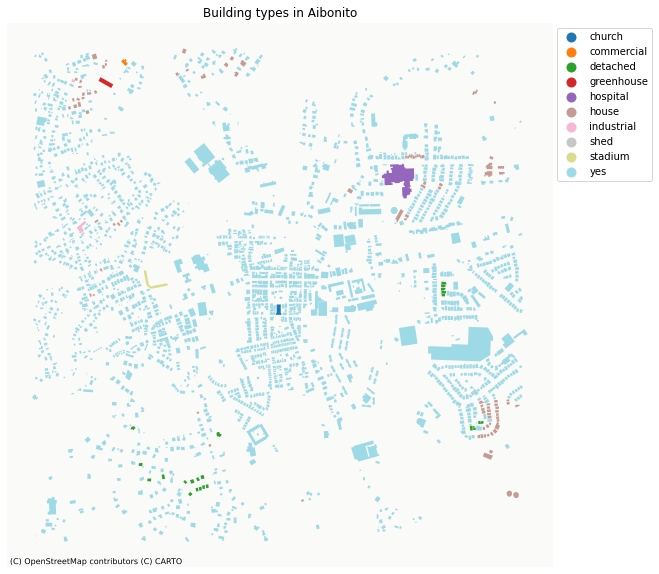

In [150]:
%%time
# run the function once
make_building_map('Aibonito')

In [151]:
address_list = ['San Juan, Puerto Rico','Guaynabo, Puerto Rico', 'Bayamon, Puerto Rico', 'Carolina, Puerto Rico']

CPU times: user 6.07 s, sys: 761 ms, total: 6.83 s
Wall time: 27.8 s


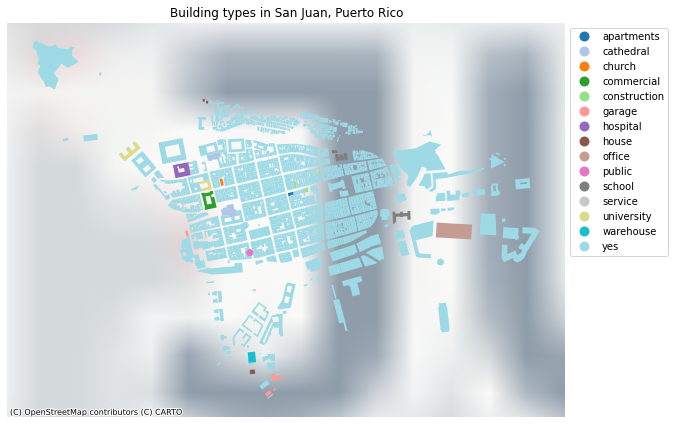

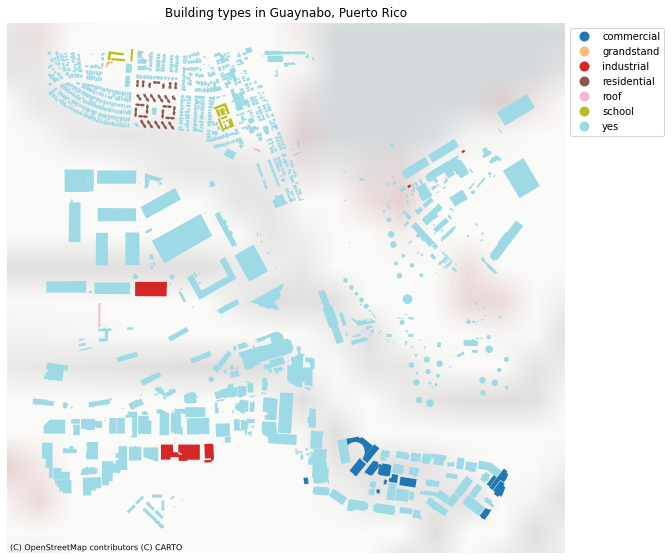

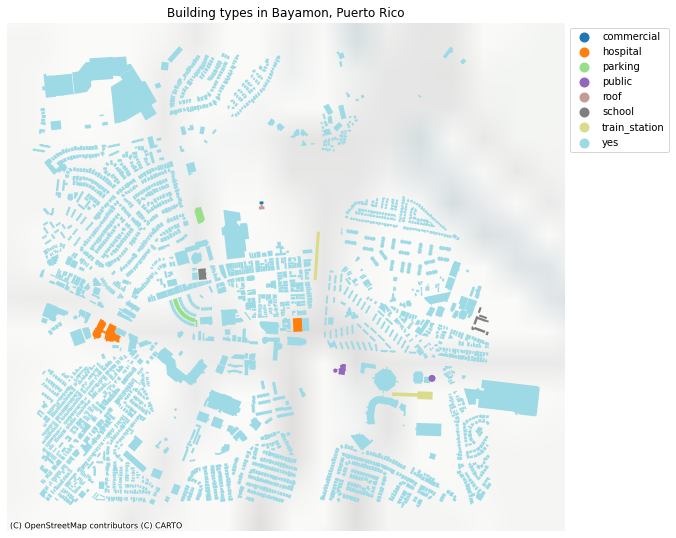

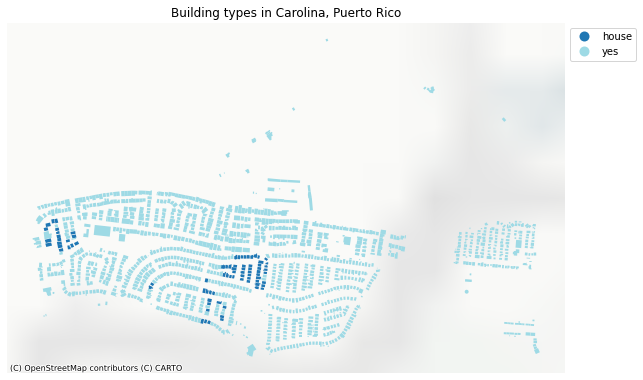

In [152]:
%%time
# run my function for every address in our list
for address in address_list:
    make_building_map(address)

It was cool running a function, OpenStreet Map is not as useful for me I believe because most buildings are yeses. I want to see now what that tourism data has. 

In [154]:
osm_tourism_counts = osm.tourism_1.value_counts()
osm_tourism_counts

artwork    1
Name: tourism_1, dtype: int64

In [ ]:
df_osm_building_types.columns = ['building_type','count']
df_osm_building_types